<a href="https://colab.research.google.com/github/Saifullah785/machine-learning-engineer-roadmap/blob/main/Lecture_68_gradient_boost_step_by_step/Lecture_68_Part_02_gradient_boosting_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np # Import numpy for numerical operations
import pandas as pd # Import pandas for data manipulation and analysis
import matplotlib.pyplot as plt # Import matplotlib.pyplot for creating static plots
import matplotlib as mpl # Import matplotlib
import seaborn as sns # Import seaborn for enhanced data visualization
import scipy.stats as stats # Import scipy.stats for statistical functions
from sklearn.tree import DecisionTreeRegressor # Import DecisionTreeRegressor from scikit-learn

import plotly.graph_objects as go # Import plotly.graph_objects for creating interactive 3D plots
import plotly.express as px # Import plotly.express for simplified interactive plotting
from plotly.subplots import make_subplots # Import make_subplots for creating subplots in plotly

sns.set() # Set the seaborn style for plots

In [2]:
import sklearn.datasets as datasets # Import datasets from scikit-learn
from matplotlib.colors import ListedColormap # Import ListedColormap from matplotlib for custom colormaps

In [3]:
# Generate synthetic data for a classification problem
data = datasets.make_circles(n_samples=100, factor=0.5, noise=0.15, random_state=0)
# Separate features (x) and labels (y) from the generated data
x, y = data[0], data[1]

In [4]:
# Select a subset of data points to create an imbalanced dataset
# Get indices where y is not 0 and indices where y is 0, excluding the last 10 of class 0
idx = np.sort(np.append(np.where(y != 0)[0], np.where(y == 0)[0][:-10]))
# Filter x and y based on the selected indices to create the imbalanced dataset
x, y = x[idx],y[idx]

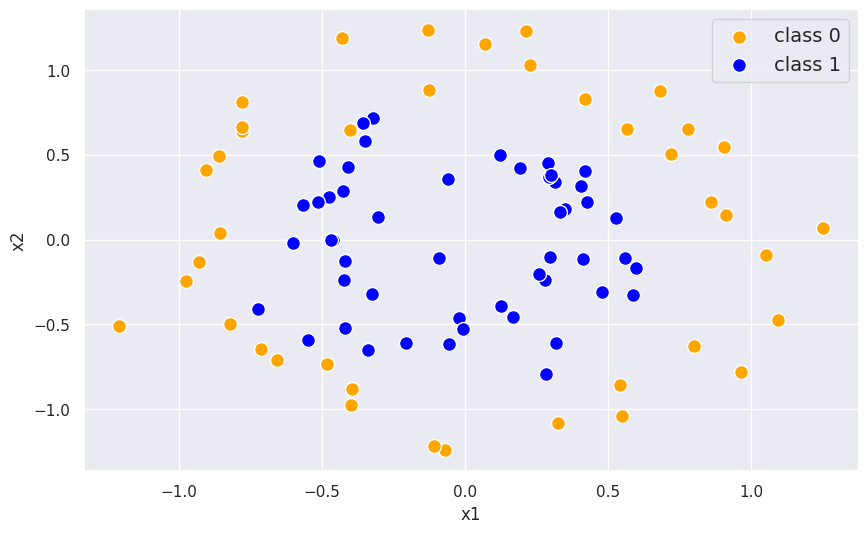

In [5]:
# Create a scatter plot of the generated data
plt.figure(figsize=(10, 6)) # Set the figure size for better visualization
# Plot points for class 0 with orange color and white edges
plt.scatter(x[y == 0, 0], x[y==0, 1], c='orange', edgecolors='w', s=100, label='class 0')
# Plot points for class 1 with blue color and white edges
plt.scatter(x[y == 1, 0], x[y==1, 1], c='blue', edgecolors='w', s=100, label='class 1') # s is the marker size
plt.xlabel('x1') # Set the label for the x-axis
plt.ylabel('x2') # Set the label for the y-axis
plt.legend(fontsize= 14) # Display the legend to identify the classes
plt.show() # Show the generated plot

In [6]:
# Define a custom color scale for plots, mapping 0 to orange and 1 to red
c_scale = [[0, "rgb(247, 168, 84)"], [1, "rgb(209, 0, 0)"]]

# Function to create a 3D scatter plot trace
def create_scatter(x, y, plot_type):
  return go.Scatter3d(
      x=x[:, 0], # x-coordinates from the first feature
      y=x[:, 1], # y-coordinates from the second feature
      z=y, # z-coordinates from the target variable
      mode='markers', # Set the plot mode to markers
      marker=dict(
          size=5, # Set marker size
          color=y, # Color markers based on the target variable
          colorscale=c_scale if plot_type == 'pred' else 'Blugrn', # Use custom colorscale for 'pred' type, otherwise 'Blugrn'
          line = dict(width=4, color='White'), # Add white outline to markers for better visibility

      ),
  )

# Function to format the layout of a plotly figure for consistent styling
def format_plot(fig):
  return fig.update_layout(
      scene = dict(
          xaxis_title='x1', # Set x-axis title for the 3D scene
          yaxis_title='x2', # Set y-axis title for the 3D scene
          zaxis_title='y' # Set z-axis title for the 3D scene
      ),
      height=400, # Set plot height
      width=600, # Set plot width
      margin=dict(l=10, r=10, b=20, t=40) # Set plot margins for better spacing
  )

In [7]:
# Create and display a 3D scatter plot of the generated data
fig = go.Figure() # Create a new plotly figure object
# Add the scatter plot trace using the create_scatter function
fig.add_trace(create_scatter(x, y, 'pred'))
fig = format_plot(fig) # Format the plot layout using the format_plot function
fig.show() # Display the created plotly figure

In [8]:
# Define the range for the meshgrid based on the minimum and maximum values of the data features
x1_min, x1_max = x[:, 0].min() - 0.5, x[:, 0].max() + 0.5
x2_min, x2_max = x[:, 1].min() - 0.5, x[:, 1].max() + 0.5

h = 0.02 # Set the step size of the mesh, controlling the density of points
# Create a meshgrid for plotting decision boundaries or surfaces
x1_mesh, x2_mesh = np.meshgrid(np.arange(x1_min, x1_max, h), np.arange(x2_min, x2_max, h))

In [9]:
# Function to create a 3D surface plot trace
def create_surface(x1, x2, y, plot_type):
  return go.Surface(x = x1, y=x2, z =y, # Set the x, y, and z data for the surface
                    showscale = False, # Hide the color scale for the surface
                    opacity=0.5, # Set the opacity of the surface
                    colorscale='Peach' if plot_type == "pred" else 'Tealgrn',) # Set the colorscale based on the plot type

In [10]:
# Calculate the mean of the target variable (for baseline prediction)
p = y.mean()

# Create a 3D plot with data points and a baseline surface representing the mean prediction
fig = go.Figure() # Create a new plotly figure
fig.add_trace(create_scatter(x, y, 'pred')) # Add the scatter plot of data points to the figure
# Add a surface representing the mean prediction across the meshgrid
fig.add_trace(create_surface(x1_mesh, x2_mesh, np.full(x1_mesh.shape, p), 'pred'))
fig = format_plot(fig) # Format the plot layout for consistent styling
fig.show() # Display the created plotly figure

In [11]:
# Function to create lines connecting the actual y values to the predicted y values (residuals)
def create_residual_lines(x, y, pred):

  x_list, y_list, z_list = [], [], []
  # Iterate through each data point to create the lines
  for i in range(len(x)):
    x_list.extend([x[i, 0], x[i, 0], None]) # Add x-coordinates for the line segment (from data point to prediction)
    y_list.extend([x[i, 1], x[i, 1], None]) # Add y-coordinates for the line segment
    z_list.extend([y[i], pred[i], None]) # Add z-coordinates (actual y and predicted y)

  # Return a Scatter3d trace with mode set to 'lines' to draw the residual lines
  return go.Scatter3d(x=x_list, y=y_list, z=z_list, mode='lines', line=dict(color='brown', width=5))

In [12]:
# Create a 3D plot including data points, the baseline mean surface, and residual lines
fig = go.Figure() # Create a new plotly figure
fig.add_trace(create_scatter(x, y, 'pred')) # Add the scatter plot of data points
fig.add_trace(create_surface(x1_mesh, x2_mesh, np.full(x1_mesh.shape, p), 'pred')) # Add the surface representing the mean prediction
fig.add_trace(create_residual_lines(x, y, np.full(y.shape, p))) # Add the residual lines connecting actual and predicted values
fig = format_plot(fig) # Format the plot layout
fig.update_layout(showlegend=False) # Hide the legend for this plot
fig.show() # Display the created plotly figure

In [13]:
def train_and_update(x, y, Fm, x1_mesh, x2_mesh, Fm_mesh, learing_rate=0.1, print_tree=True):
  """
  This function trains a single decision tree, updates the model's prediction,
  and returns the trained tree and updated values.

  Args:
    x: The input features.
    y: The true labels.
    Fm: The current model's log-odds prediction.
    x1_mesh: The x1 coordinates of the meshgrid.
    x2_mesh: The x2 coordinates of the meshgrid.
    Fm_mesh: The current model's log-odds prediction on the meshgrid.
    learing_rate: The learning rate for the gradient boosting update.
    print_tree: Whether to print the structure of the trained tree.

  Returns:
    A tuple containing the trained tree, the residuals, the updated log-odds,
    the predicted residuals on the meshgrid, and the updated log-odds on the meshgrid.
  """

  # Calculate the predicted probabilities
  p = np.exp(Fm) / (1 + np.exp(Fm))

  # Calculate the residuals (pseudo-residuals)
  r = y - p

  # Train a decision tree on the residuals
  tree = DecisionTreeRegressor(max_depth=1, random_state=0)
  tree.fit(x, r)
  ids = tree.apply(x)

  # Print the tree structure if requested
  if print_tree:
    print_tree_structure(tree)

  # Predict the residuals on the meshgrid
  x_mesh = np.c_[x1_mesh.ravel(), x2_mesh.ravel()]
  r_pred_mesh = tree.predict(x_mesh).reshape(x1_mesh.shape)

  # Update the model's prediction
  for j in np.unique(ids):
    fltr = ids == j
    num = r[fltr].sum()
    den = (p[fltr]*(1-p[fltr])).sum()
    gamma = num / den
    Fm[fltr] += learing_rate * gamma

    # Update the tree's prediction to be the gamma value
    tree.tree_.value[j,0,0] = gamma

  # Update the model's prediction on the meshgrid
  gamma_update_mesh = tree.predict(x_mesh).reshape(x1_mesh.shape)
  Fm_mesh += learing_rate * gamma_update_mesh

  # Calculate the new predicted probabilities on the meshgrid
  p_mesh = np.exp(Fm_mesh) / (1 + np.exp(Fm_mesh))

  return tree, r, Fm,r_pred_mesh, Fm_mesh

In [14]:
def print_tree_structure(clf):
    """Prints the structure of a decision tree classifier."""

    n_nodes = clf.tree_.node_count
    children_left = clf.tree_.children_left
    children_right = clf.tree_.children_right
    feature = clf.tree_.feature
    threshold = clf.tree_.threshold

    node_depth = np.zeros(shape=n_nodes, dtype=np.int64)
    is_leaves = np.zeros(shape=n_nodes, dtype=bool)
    stack = [(0, 0)]  # start with the root node id (0) and its depth (0)
    while len(stack) > 0:
        # `pop` ensures each node is only visited once
        node_id, depth = stack.pop()
        node_depth[node_id] = depth

        # If the left and right child of a node is not the same we have a split
        # node
        is_split_node = children_left[node_id] != children_right[node_id]
        # If a split node, append left and right children and depth to `stack`
        # so we can loop through them
        if is_split_node:
            stack.append((children_left[node_id], depth + 1))
            stack.append((children_right[node_id], depth + 1))
        else:
            is_leaves[node_id] = True

    print('-'*80)
    print(
        "The binary tree structure has {n} nodes and has "
        "the following tree structure:\n".format(n=n_nodes)
    )
    for i in range(n_nodes):
        if is_leaves[i]:
            print(
                "{space}node={node} is a leaf node.".format(
                    space=node_depth[i] * "\t", node=i
                )
            )
            print(node_depth[i] * '\t', f"prediction: {clf.tree_.value[i, 0, 0]:.1f}")
        else:
            print(
                "{space}node={node} is a split node: "
                "go to node {left} if X[:, {feature}] <= {threshold} "
                "else to node {right}.".format(
                    space=node_depth[i] * "\t",
                    node=i,
                    left=children_left[i],
                    feature=feature[i],
                    threshold=threshold[i],
                    right=children_right[i],
                )
            )
    print('-'*80)

In [15]:
# Initialize the model's prediction with the log-odds of the mean of y
F0 = np.log(p/(1-p))
F0 = np.full(len(y), F0)
F0_mesh = np.full(x1_mesh.shape, F0[0])

# Set the learning rate
learing_rate = 0.9

# Train the first tree and update the model's prediction
tree, r, Fm, r_pred_mesh, Fm_mesh = train_and_update(x, y, F0, x1_mesh, x2_mesh, F0_mesh, learing_rate=learing_rate)

# Create a 3D plot of the residuals and the decision tree's prediction
fig = go.Figure()
fig.add_trace(create_scatter(x, r, "res"))
fig.add_trace(create_surface(x1_mesh, x2_mesh, r_pred_mesh, "res"))
fig = format_plot(fig)
fig.update_layout(showlegend=False)
fig.show()

--------------------------------------------------------------------------------
The binary tree structure has 3 nodes and has the following tree structure:

node=0 is a split node: go to node 1 if X[:, 0] <= 0.6397739946842194 else to node 2.
	node=1 is a leaf node.
	 prediction: 0.1
	node=2 is a leaf node.
	 prediction: -0.6
--------------------------------------------------------------------------------


In [16]:
# Create a 3D plot of the data and the updated model's prediction surface
fig = go.Figure()
fig.add_trace(create_scatter(x, y, "pred"))
fig.add_trace(create_surface(x1_mesh, x2_mesh, Fm_mesh, "pred"))
fig = format_plot(fig)
fig.update_layout(showlegend=False)
fig.show()

In [17]:
# Train the second tree and update the model's prediction
tree2, r2, Fm2, r_pred_mesh2, Fm_mesh2 = train_and_update(x, y, Fm, x1_mesh, x2_mesh, Fm_mesh, learing_rate=learing_rate)

# Create a 3D plot of the data and the updated model's prediction surface
fig = go.Figure()
fig.add_trace(create_scatter(x, y, "pred"))
fig.add_trace(create_surface(x1_mesh, x2_mesh, Fm_mesh2, "pred"))
fig = format_plot(fig)
fig.update_layout(showlegend=False)
fig.show()

--------------------------------------------------------------------------------
The binary tree structure has 3 nodes and has the following tree structure:

node=0 is a split node: go to node 1 if X[:, 0] <= -0.6295882761478424 else to node 2.
	node=1 is a leaf node.
	 prediction: -0.5
	node=2 is a leaf node.
	 prediction: 0.1
--------------------------------------------------------------------------------


In [18]:
# Train 10 more trees
for i in range(10):
  tree, r, Fm, r_pred_mesh, Fm_mesh = train_and_update(x, y, Fm, x1_mesh, x2_mesh, Fm_mesh, learing_rate=learing_rate, print_tree=False)

# Create a 3D plot of the data and the final model's prediction surface
fig = go.Figure()
fig.add_trace(create_scatter(x, y, "pred"))
fig.add_trace(create_surface(x1_mesh, x2_mesh, Fm_mesh, "pred"))
fig = format_plot(fig)
fig.update_layout(showlegend=False)
fig.show()

In [19]:
def create_prev_surface(x1, x2, y, plot_type):

    return go.Surface(x=x1, y=x2, z=y,
                      showscale=False,
                      opacity=0.5,
                      colorscale="Purples",
                      surfacecolor=np.ones(x1.shape),
                      )

In [20]:
p_mesh = np.exp(Fm_mesh) / (1 + np.exp(Fm_mesh))

fig = go.Figure()
fig.add_trace(create_scatter(x, y, "pred"))
fig.add_trace(create_prev_surface(x1_mesh, x2_mesh, np.full(x1_mesh.shape, p), "pred"))
fig.add_trace(create_surface(x1_mesh, x2_mesh, p_mesh, "pred"))
fig = format_plot(fig)
fig.update_layout(showlegend=False)
fig.show()

In [21]:
p = np.exp(Fm) / (1 + np.exp(Fm))

fig = go.Figure()
fig.add_trace(create_scatter(x, y, "pred"))
fig.add_trace(create_surface(x1_mesh, x2_mesh, p_mesh, "pred"))
fig.add_trace(create_residual_lines(x, y, p))
fig = format_plot(fig)
fig.update_layout(title="Updated Residuals", showlegend=False)
fig.show()